Yoel Bokobza 


**Before running this notebook, you have to upload the files in https://drive.google.com/drive/folders/13KnN9_QVxUXfIzn4Tz-wInfHsRwZ8S_L?usp=sharing, into the drive in: /content/gdrive/My Drive**

In [ ]:
!pip install hdf5storage

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 53 kB 1.8 MB/s 


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')


Mounted at /content/gdrive


## Import Libraries

In [ ]:
import os
print(os.getcwd())
os.chdir('/content/gdrive/My Drive/DPIR/DPIR-master')
print(os.getcwd())

/content
/content/gdrive/My Drive/DPIR/DPIR-master


In [ ]:
import os.path
import cv2

from scipy.io import loadmat
import numpy as np
from datetime import datetime
from collections import OrderedDict
import hdf5storage
from scipy import ndimage
import pandas as pd
import torch

# from utils import utils_logger
from utils import utils_model
from utils import utils_pnp as pnp #get alpha and sigma
from utils import utils_sisr as sr # Fourier calcs for step 1
from utils import utils_image as util #image utils
from utils import utils_mosaic

# MAP Derivation


$
\hat{x} = \mathop{\arg \max}\limits_{x} \mathbb{\log{p(y|x)} + \log{p(x)}}
$

$
\hat{x} = \mathop{\arg \min}\limits_{x} \mathbb{\frac{1}{2 \sigma^{2}} \rVert{y-\tau{(x)}}\Vert ^{2} + \lambda \Re(x)}
$


# Half Quadratic Splitting (HQS) Algorithm

$
\hat{x} = \mathop{\arg \min}\limits_{x} \mathbb{\frac{1}{2 \sigma^{2}} \rVert{y-\tau{(x)}}\Vert ^{2} + \lambda \Re(z)} \quad s.t. \quad z=x 
$

$L_{\mu}(x, z) = \frac{1}{2 \sigma^{2}} \rVert{y-\tau{(x)}}\Vert ^{2} + \lambda \Re(z) + \frac{\mu}{2} \rVert{z-x}\rVert ^{2}$




This can be solved via the iterative solver:

$x_{k} = \mathop{\arg \min}\limits_{x} \mathbb{\rVert{y - \tau{(x)}} \rVert ^{2} + \mu \sigma^{2} \rVert {x - z_{k-1}} \rVert ^ 2 }
$

$z_{k} = \mathop{\arg \min}\limits_{x} \mathbb{\frac{1}{2 \sqrt{(\lambda / \mu) ^ {2}}} \rVert z - x_{k} \rVert ^2 + \Re(z)}
$



Notice that when we develop the MAP estimator for the Denoising problem $y=x+n$ when $n \sim \mathcal{N}(0,\,\sigma^{2}I) $ when $I$ is identity matrix of size $N \times N $ we will get $
\hat{x} = \mathop{\arg \max}\limits_{x} \mathbb{\log{p(y|x)} + \log{p(x)}}
=  \mathop{\arg \max}\limits_{x} \mathbb{\log{\frac{1}{\sqrt{(2\pi)^N}\sigma^{N}}e^{-\frac{\rVert y-x \rVert ^2}{2\sigma^2}}} + \log{p(x)}} = 
$

$\mathop{\arg \max}\limits_{x} \mathbb{-\frac{\rVert y-x \rVert ^2}{2\sigma^2}} + \log{\frac{1}{\sqrt{(2\pi)^N}\sigma^{N}}  + \log{p(x)}}= \mathop{\arg \max}\limits_{x} \mathbb{-  \frac{\rVert y-x \rVert ^2}{2\sigma^2}} + \log{p(x)}= $
$\mathop{\arg \min}\limits_{x} \mathbb{\frac{1}{2 \sqrt{(\sigma^2) ^ {2}}} \rVert y-x \rVert ^2 + \Re(x)}$

Notice that we got that our second subproblem is equal to map estimation to denoising problem, so the second subproblem can be solved via a neural network that her mission is denoising images

Therefore at the input to the network is the noisy image which is $x_k$ and at the output the image $z_k$ is obtained when the noise level map of the noise is $\sqrt{\frac{\lambda}{\mu}}$

$\implies$
$z_{k} = Denoiser\Big(x_k, \sqrt{\frac{\lambda}{\mu}}\Big)
$

We define $\{\sigma_k\}_{k=1}^{K}$ such that they are decreased from $\sigma_1$ to $\sigma_K$, where $K$ is the number of iterations. This implies that $\{\mu_k\}_{k=1}^{K}$, $\mu_k= \frac{\lambda}{\sigma_k^2}$, i.e., $\mu_1<\mu_2<\cdot \cdot \cdot<\mu_K$, which guarantees that $x_k$ and $z_k$ converge to a fixed point.

Using these notations the iterative algorithm is:



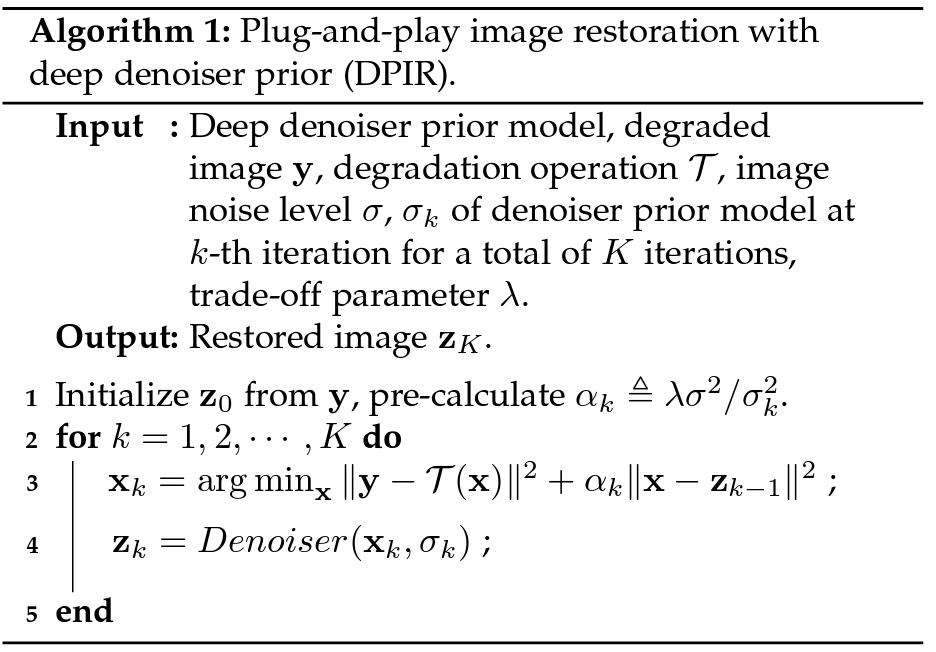

In [ ]:
from IPython.display import Image
Image(filename='imgs/Alg_Pseud.PNG')

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

# Image Deblurring Problem

$x_{k} = \mathop{\arg \min}\limits_{x} \mathbb{\rVert{y - \tau{(x)}} \rVert ^{2} + \mu \sigma^{2} \rVert x - z_{k-1} \rVert ^ 2 }
$ 

$\tau{(\cdot)}$ for image deblurring is a two-dimensional convolution
operation, e.g.

$ \tau_{x}^{d} = x \otimes k$

$x_{k} = \mathop{\arg \min}\limits_{x} \mathbb{\rVert {y - \tau_{x}^{d}} \rVert ^{2} + \mu \sigma^{2} \rVert{x - z_{k-1}} \rVert ^ 2 }
$

The fast close form solution:

$\quad \color{blue}{\boxed{\color{black}{x_{k} = \mathcal{F} ^{-1} \Big{(}\frac{\overline{\mathcal{F} (k)} \mathcal{F} (y) + \mu\sigma^2 \mathcal{F} (z_{k-1})}{\overline{\mathcal{F} (k)} \mathcal{F} (k) + \mu\sigma^2}\Big{)}}}}$



## Preperation

In [ ]:
noise_level_img = 7.65/255.0         #(sigma) noise level for low resolution (LR) image
noise_level_model = noise_level_img  # noise level of model
model_name = 'drunet_color'           # 'drunet_gray' | 'drunet_color' 
testset_name = 'set3c'               # test set,  'set5' | 'srbsd68'
iter_num = 8                         # number of iterations
modelSigma1 = 49                     # Maximal sigma value (sigma_1)
modelSigma2 = noise_level_model*255. # Minimal sigma value (sigma_K)

## Load kernels

In [ ]:
kernels = hdf5storage.loadmat(os.path.join('kernels', 'Levin09.mat'))['kernels']

sf = 1 #scale factor
n_channels = 3 if 'color' in  model_name else 1  # fixed
model_zoo = 'model_zoo'              # fixed
testsets = 'testsets'                # fixed
L_path = os.path.join(testsets, testset_name) # L_path, for Low-quality images

model_path = os.path.join(model_zoo, model_name+'.pth')
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.cuda.empty_cache()

## Setting output images path

## Load the Model

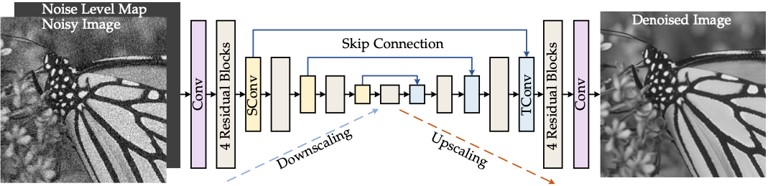

In [ ]:
Image(filename='imgs/Picture1.jpg')

In [ ]:
from models.network_unet import UNetRes as net
"""
"nc" determines the number of channels from the first scale to the last scale in the U-Net
"act_mode" defines the activation function, where 'R' corresponding to the ReLU function
"downsample_mode" ,and "upsample_mode" defines to downsample algorithm and the upsample algorithm, respectively.
"""
model = net(in_nc=n_channels+1, out_nc=n_channels, nc=[64, 128, 256, 512], nb=4, act_mode='R', downsample_mode="strideconv", upsample_mode="convtranspose")
model.load_state_dict(torch.load(model_path), strict=True)
model.eval()
for _, v in model.named_parameters():
    v.requires_grad = False
model = model.to(device)


## The iterative algorithm

#################################### Kernel_0##########################################


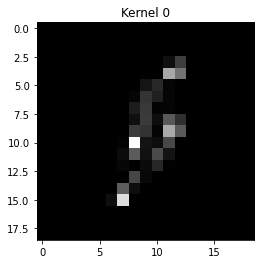

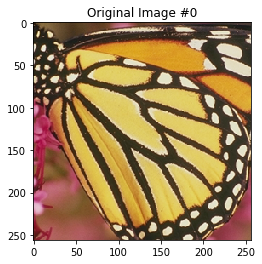

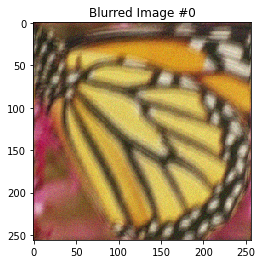

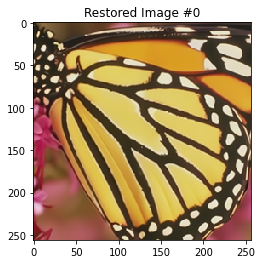

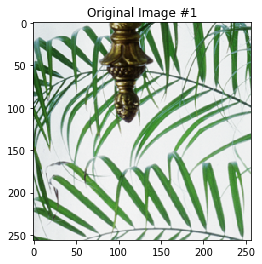

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


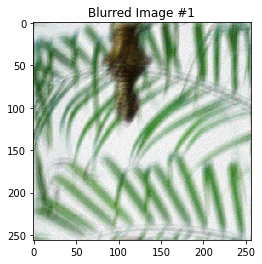

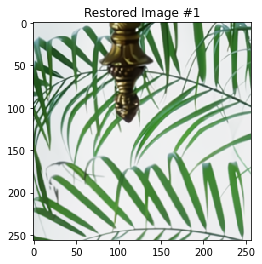

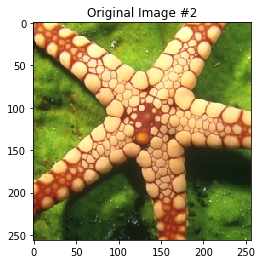

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


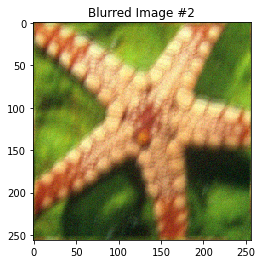

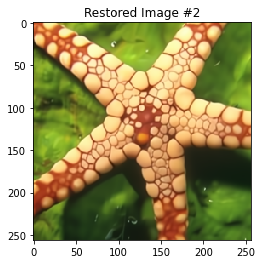

#################################### Kernel_1##########################################


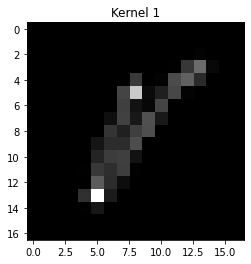

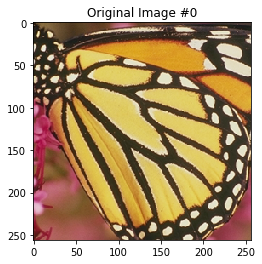

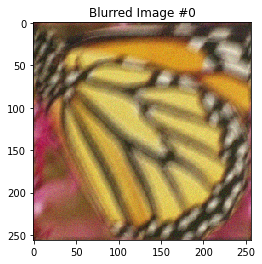

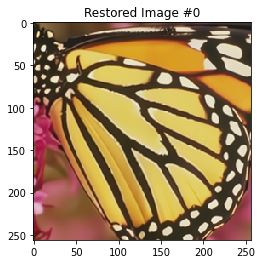

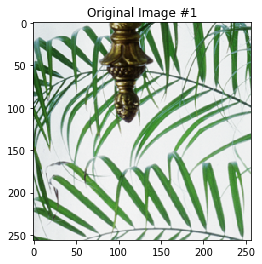

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


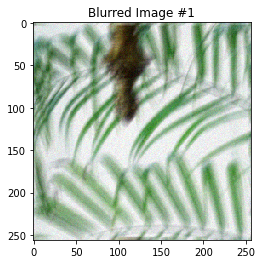

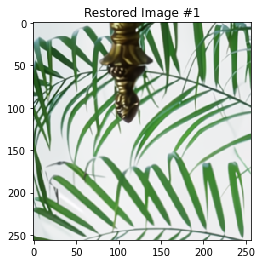

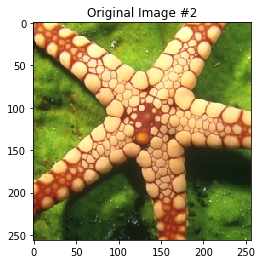

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


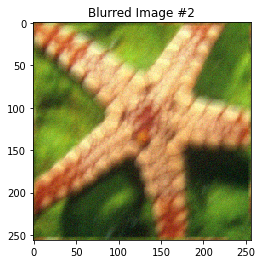

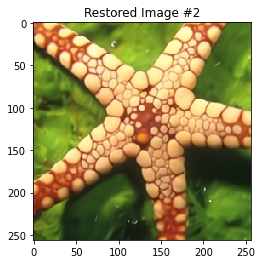

#################################### Kernel_2##########################################


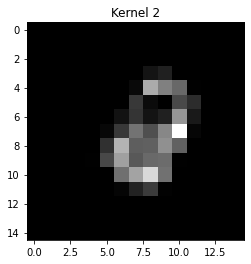

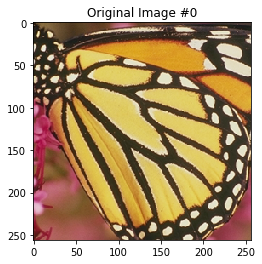

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


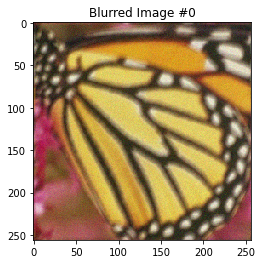

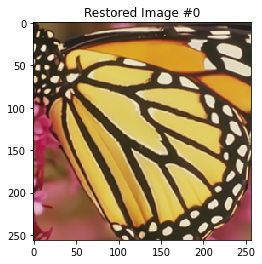

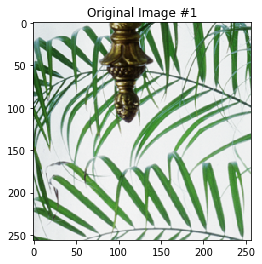

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


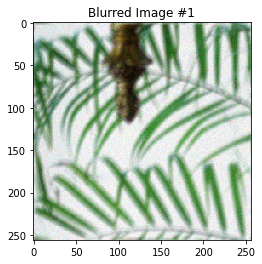

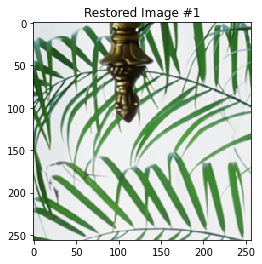

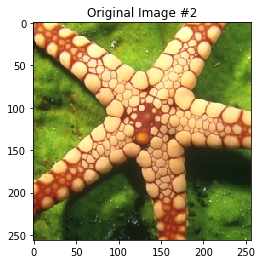

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


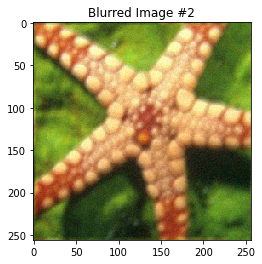

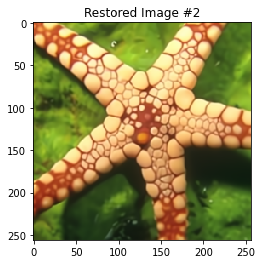

#################################### Kernel_3##########################################


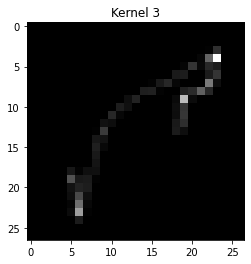

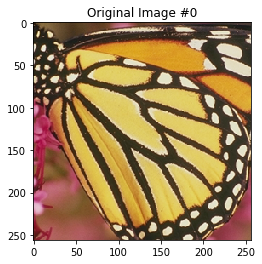

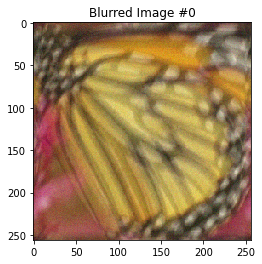

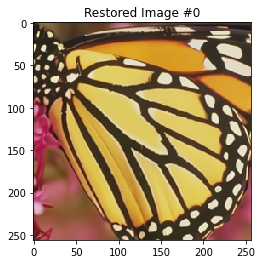

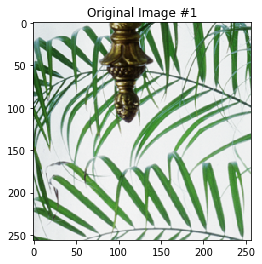

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


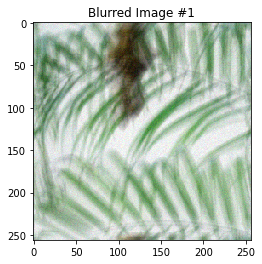

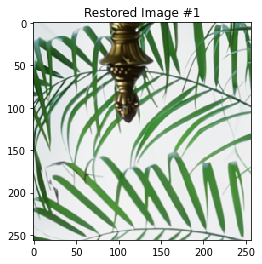

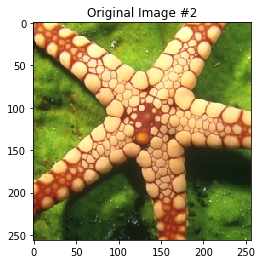

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


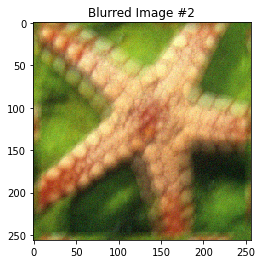

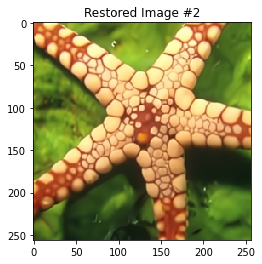

#################################### Kernel_4##########################################


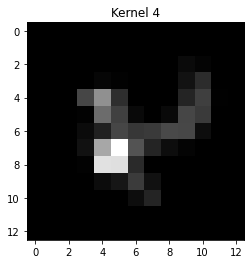

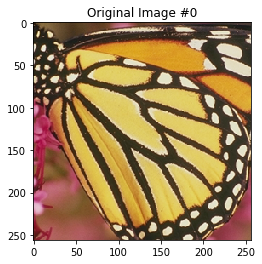

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


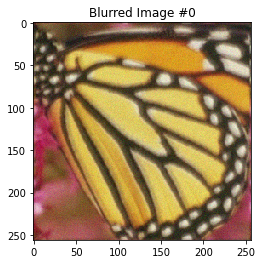

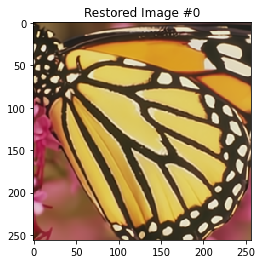

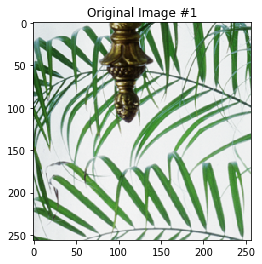

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


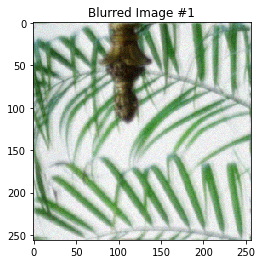

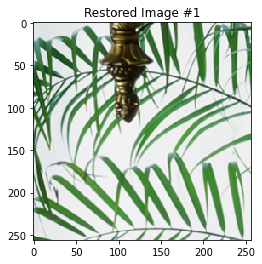

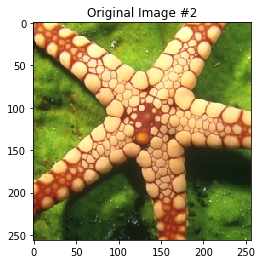

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


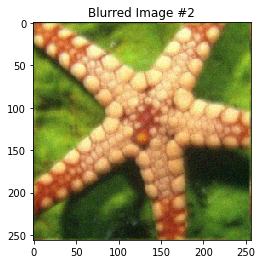

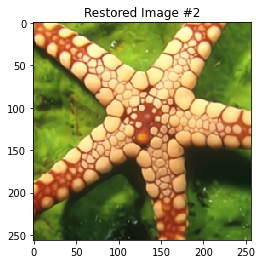

#################################### Kernel_5##########################################


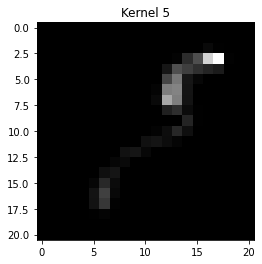

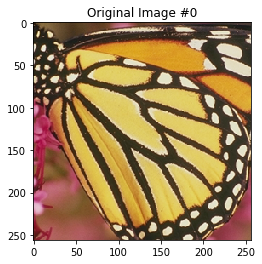

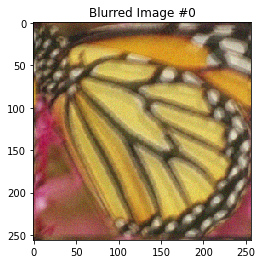

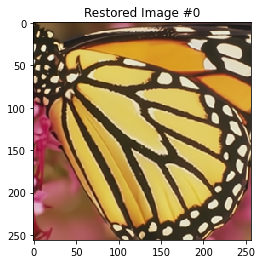

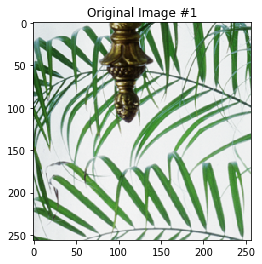

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


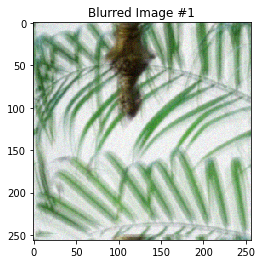

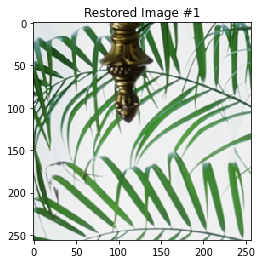

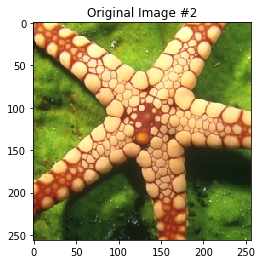

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


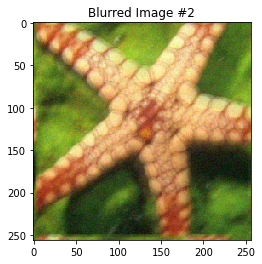

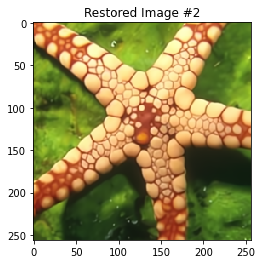

#################################### Kernel_6##########################################


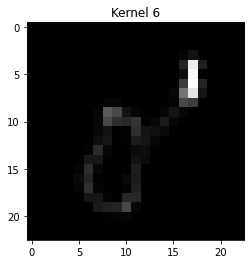

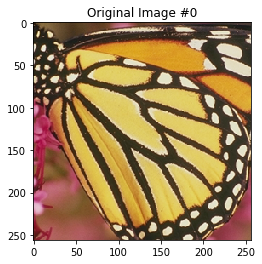

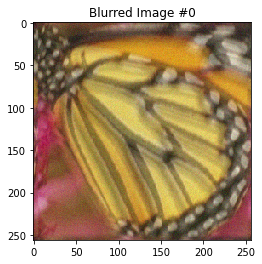

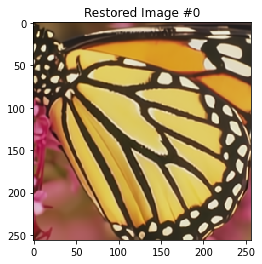

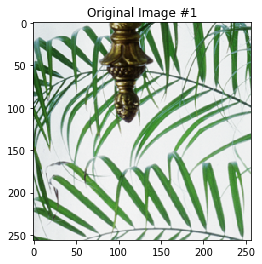

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


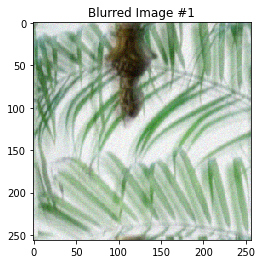

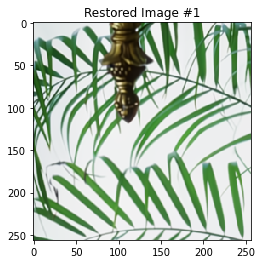

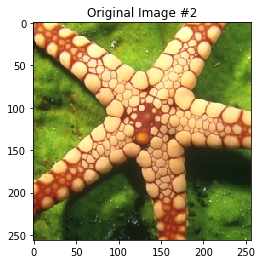

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


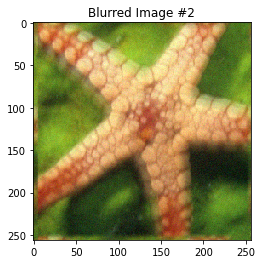

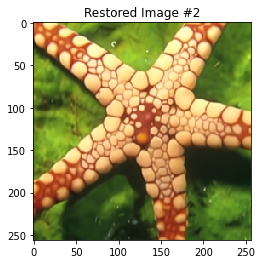

#################################### Kernel_7##########################################


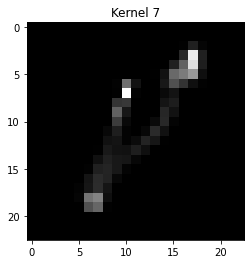

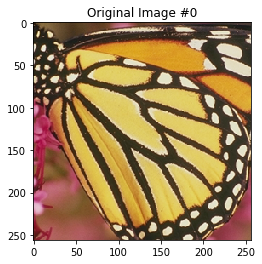

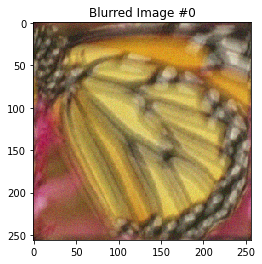

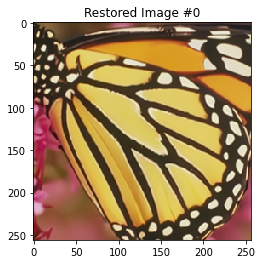

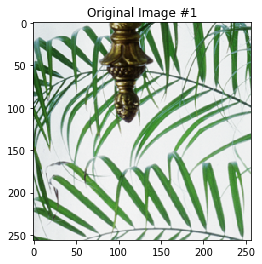

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


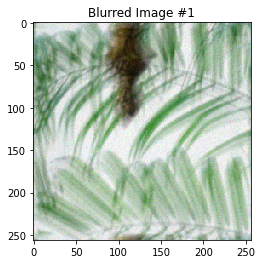

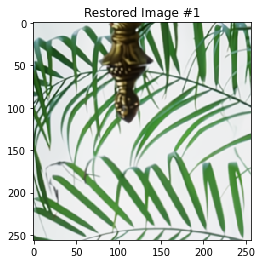

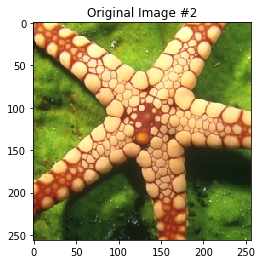

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


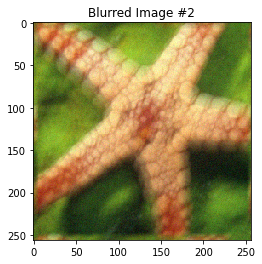

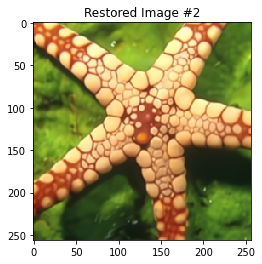

In [ ]:
L_paths = util.get_image_paths(L_path)

test_results_ave = OrderedDict()
test_results_ave['psnr'] = []  # record average PSNR for each kernel

for k_index in range(kernels.shape[1]):
      print('#################################### Kernel_'+str(k_index)+'##########################################')
      test_results = OrderedDict()
      test_results['psnr'] = []
      k = kernels[0, k_index].astype(np.float64)
      util.imshow(k, title='Kernel {}'.format(k_index)) 

      for idx, img in enumerate(L_paths):

          # --------------------------------
          # (1) get a Blurry Image
          # --------------------------------

          img_name, ext = os.path.splitext(os.path.basename(img))
          img_H = util.imread_uint(img, n_channels=n_channels) #read the image
          util.imshow(img_H, title='Original Image #{}'.format(idx))

          img_L = ndimage.filters.convolve(img_H, np.expand_dims(k, axis=2), mode='wrap') #convolve it with a kernel
          img_L = util.uint2single(img_L) #normalizing img

          np.random.seed(seed=0)  # for reproducibility
          img_L += np.random.normal(0, noise_level_img, img_L.shape) # add AWGN
          util.imshow(img_L, title='Blurred Image #{}'.format(idx))
          # --------------------------------
          # (2) get alpha and sigmas
          # --------------------------------
          #alpha is the alpha_k=lambda*sigma/sigma_k^2
          alpha, sigmas = pnp.get_rho_sigma(sigma=max(0.255/255., noise_level_model), iter_num=iter_num, modelSigma1=modelSigma1, modelSigma2=modelSigma2, w=1.0)
          alpha, sigmas = torch.tensor(alpha).to(device), torch.tensor(sigmas).to(device)

          # --------------------------------
          # (3) initialize x, and pre-calculation
          # --------------------------------

          x = util.single2tensor4(img_L).to(device)

          img_L_tensor, k_tensor = util.single2tensor4(img_L), util.single2tensor4(np.expand_dims(k, 2))
          [k_tensor, img_L_tensor] = util.todevice([k_tensor, img_L_tensor], device)
          FB, FBC, F2B, FBFy = sr.pre_calculate(img_L_tensor, k_tensor, sf) 

          # --------------------------------
          # (4) main iterations
          # --------------------------------

          for i in range(iter_num):

              # --------------------------------
              # step 1, FFT
              # --------------------------------

              tau = alpha[i].float().repeat(1, 1, 1, 1)
              x = sr.data_solution(x, FB, FBC, F2B, FBFy, tau, sf)
              # --------------------------------
              # step 2, denoiser
              # --------------------------------
          
              x = torch.cat((x, sigmas[i].float().repeat(1, 1, x.shape[2], x.shape[3])), dim=1) #concatenating the noise level map with the image
              x = utils_model.test_mode(model, x, mode=2, refield=32, min_size=256, modulo=16)

          # --------------------------------
          # (3) Unblurred Image
          # --------------------------------

          img_E = util.tensor2uint(x)
          util.imshow(img_E, title='Restored Image #{}'.format(idx))
          if n_channels == 1:
              img_H = img_H.squeeze()

          psnr = util.calculate_psnr(img_E, img_H, border=0)  
          test_results['psnr'].append(psnr)

      ave_psnr = sum(test_results['psnr']) / len(test_results['psnr'])
      test_results_ave['psnr'].append(ave_psnr)



## The average PSNR per kernel

In [ ]:
df = pd.DataFrame(test_results_ave, columns=test_results_ave.keys())
df


,psnr
0,30.326234
1,29.737416
2,29.867047
3,29.669633
4,31.265835
5,31.081449
6,30.208672
7,29.715210


# Single Image Super-Resolution (SISR)

### Super Resolution Problem



$x_{k} = \mathop{\arg \min}\limits_{x} \mathbb{\rVert{y - \tau{(x)}} \rVert ^{2} + \mu \sigma^{2} \rVert {x - z_{k-1}} \rVert ^ 2 }
$ 

$\tau{(\cdot)}$ for image super resolution is a composite
operation of convolution and down-sampling, i.e.
$\tau(x)=(x\otimes k)\downarrow_s$

The fase closed-form solution is,

$\color{blue}{\boxed{\color{black}{x_k = \mathcal{F}^{-1}\Big(\frac{1}{\alpha_k}\big( d-\overline{\mathcal{F}(k)}\odot_s\frac{(\mathcal{F}(k)d)\Downarrow_s}{(\overline{\mathcal{F}(k)}\mathcal{F}(k))\Downarrow_s+\alpha_k}\big) \Big)}}},$

where, $d = \mathcal{F}(k)\mathcal{F}(y\uparrow_{s}) + \alpha_{k}\mathcal{F}(z_{k-1})$, $\odot_s$ denotes distinct block processing operator with element-wise
multiplication, i.e., applying element-wise multiplication to
the $s \times s$ distinct blocks of $\mathcal{F}(k)$, and $\Downarrow_{s}$ denotes distinct block downsampler, i.e., averaging the $s \times s$ distinct blocks.

In [ ]:
iter_num = 24                         # number of iterations
noise_level_img = 3.5/255.0         # default: 0, noise level for low resolution (LR) image
noise_level_model = noise_level_img  # noise level of model, default 0
testset_name = 'set3c'               # test set
L_path = os.path.join(testsets, testset_name)
L_paths = util.get_image_paths(L_path)

In [ ]:
sf = 3  # set scale factor, 2,3,4
kernels = loadmat(os.path.join('kernels', 'kernels_bicubicx234.mat'))['kernels']
modelSigma2 = max(sf, noise_level_model*255.)

/content/gdrive/My Drive/DPIR/DPIR-master/utils/utils_image.py:64: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(0.9)


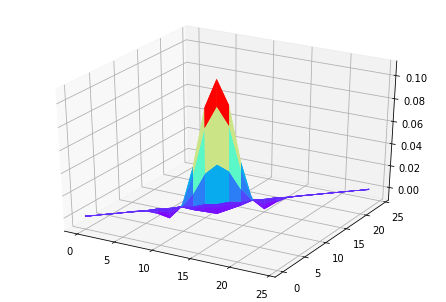

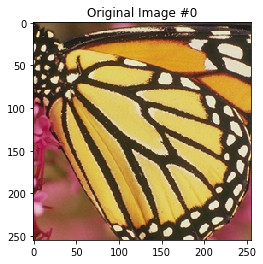

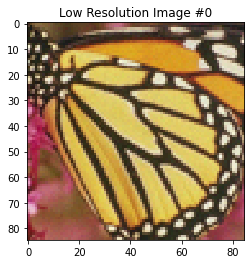

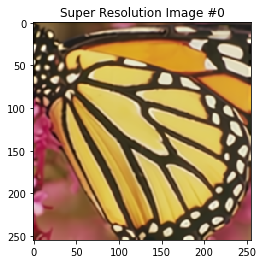

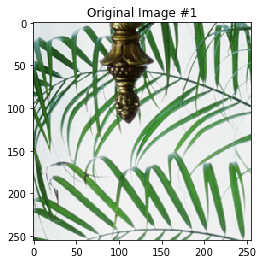

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


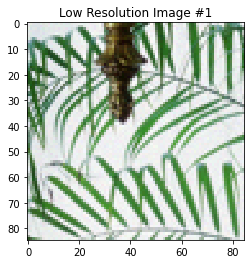

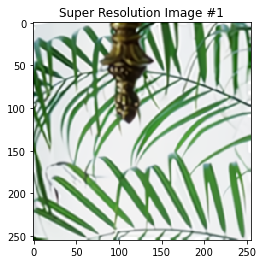

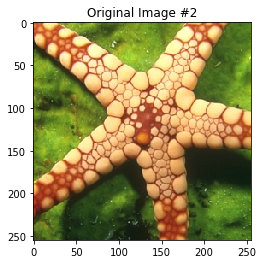

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


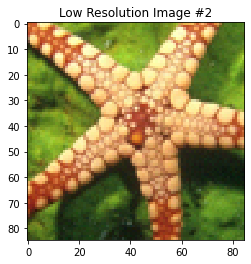

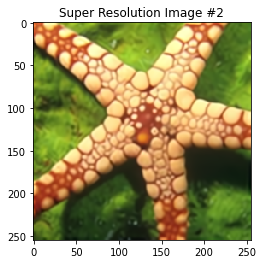

In [ ]:
test_results = OrderedDict()
test_results['psnr'] = []

k_index = sf-2
k = kernels[0, k_index].astype(np.float64)

util.surf(k) 
for idx, img in enumerate(L_paths):

    # --------------------------------
    # (1) get Low Resolution
    # --------------------------------

    img_name, ext = os.path.splitext(os.path.basename(img))
    img_H = util.imread_uint(img, n_channels=n_channels) #read the image
    img_H = util.modcrop(img_H, sf)  # modcrop used to crop the image such that "sf" will be divisor of both the length and the width of the image
    util.imshow(img_H, title="Original Image #{}".format(idx))

    img_L = ndimage.filters.convolve(img_H, np.expand_dims(k, axis=2), mode='wrap') #applying kernel
    img_L = util.imresize_np(util.uint2single(img_H), 1/sf) #downsample

    np.random.seed(seed=0)  # for reproducibility
    img_L += np.random.normal(0, noise_level_img, img_L.shape) # add AWGN
    util.imshow(img_L, title="Low Resolution Image #{}".format(idx))
    # --------------------------------
    # (2) get alphas and sigmas
    # --------------------------------

    alphas, sigmas = pnp.get_rho_sigma(sigma=max(0.255/255., noise_level_model), iter_num=iter_num, modelSigma1=modelSigma1, modelSigma2=modelSigma2, w=1)
    alphas, sigmas = torch.tensor(alphas).to(device), torch.tensor(sigmas).to(device)

    # --------------------------------
    # (3) initialize x, and pre-calculation
    # --------------------------------

    x = cv2.resize(img_L, (img_L.shape[1]*sf, img_L.shape[0]*sf), interpolation=cv2.INTER_CUBIC)
    if np.ndim(x)==2:
        x = x[..., None]

    x = util.single2tensor4(x).to(device)

    img_L_tensor, k_tensor = util.single2tensor4(img_L), util.single2tensor4(np.expand_dims(k, 2))
    [k_tensor, img_L_tensor] = util.todevice([k_tensor, img_L_tensor], device)
    FB, FBC, F2B, FBFy = sr.pre_calculate(img_L_tensor, k_tensor, sf)

    # --------------------------------
    # (4) main iterations
    # --------------------------------

    for i in range(iter_num):
        # --------------------------------
        # step 1, FFT
        # --------------------------------

        tau = alphas[i].float().repeat(1, 1, 1, 1)
        x = sr.data_solution(x.float(), FB, FBC, F2B, FBFy, tau, sf)

        # --------------------------------
        # step 2, denoiser
        # --------------------------------
        
        x = torch.cat((x, sigmas[i].float().repeat(1, 1, x.shape[2], x.shape[3])), dim=1)
        x = utils_model.test_mode(model, x, mode=2, refield=32, min_size=256, modulo=16)
        
    # --------------------------------
    # (3) SR Image
    # --------------------------------

    img_E = util.tensor2uint(x)
    util.imshow(img_E, title="Super Resolution Image #{}".format(idx))
    

    if n_channels == 1:
        img_H = img_H.squeeze()

    psnr = util.calculate_psnr(img_E, img_H, border=sf)
    test_results['psnr'].append(psnr)



## PSNR

In [ ]:
print("The PSNR per Image are: {}".format(test_results['psnr']))


The PSNR per Image are: [26.823636508622744, 26.09838143019925, 27.906227414862236]


# Color Image Demosaicing

In this section a closed solution is found for the image demosaicing problem for the optimization problem:

$x_{k} = \mathop{\arg \min}\limits_{x} \mathbb{\rVert{y - \tau_{demos}{(x)}} \rVert ^{2} + \mu \sigma^{2} \rVert {x - z_{k-1}} \rVert ^ 2 }
$ 

The degradation model of mosaiced
image can be expressed as $y = M \odot x$ where M is determined by color filter array (CFA) pattern and is a matrix
with binary elements indicating the missing pixels of y,
and $\odot$ denotes element-wise multiplication

The fast closed_form solution is:

$\color{blue}{\boxed{\color{black}{x_{k} = \frac{M \odot y + \mu\sigma^2 z_{k-1}}{M + \mu\sigma^2} = \frac{M \odot y + \alpha_{k-1} z_{k-1}}{M + \alpha_{k-1}}}}}$ 


In [ ]:
iter_num = 40    # set number of iterations, default: 40 for demosaicing
modelSigma2 = 0.6

In [ ]:
testset_name = 'myset'  
L_path = os.path.join(testsets, testset_name)
L_paths = util.get_image_paths(L_path)


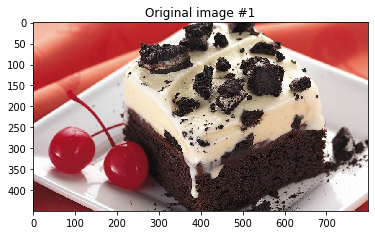

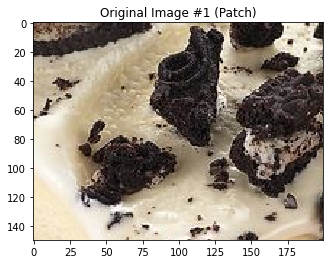

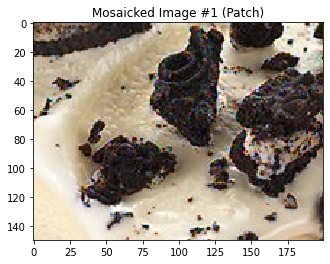

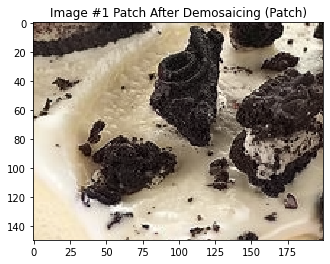

In [ ]:
test_results = OrderedDict()
test_results['psnr'] = []

for idx, img in enumerate(L_paths):

    
    idx += 1
    img_name, ext = os.path.splitext(os.path.basename(img))
    img_H = util.imread_uint(img, n_channels=n_channels) #read the image
    util.imshow(img_H, title="Original image #{}".format(idx))
    util.imshow_patch(img_H, TLC=(100,300), BRC=(250,500), title="Original Image #{} (Patch)".format(idx))
    CFA, CFA4, mosaic, mask = utils_mosaic.mosaic_CFA_Bayer(img_H)

    # --------------------------------
    # (2) initialize x and get the mosaicked image
    # --------------------------------

    CFA4 = util.uint2tensor4(CFA4).to(device)
    x = utils_mosaic.dm_matlab(CFA4)

    img_L = util.tensor2uint(x)
    y = util.uint2tensor4(mosaic).to(device)

    util.imshow_patch(img_L, TLC=(100,300), BRC=(250,500), title="Mosaicked Image #{} (Patch)".format(idx))
    mask = util.single2tensor4(mask.astype(np.float32)).to(device)

    # --------------------------------
    # (3) get alphas and sigmas
    # --------------------------------

    alphas, sigmas = pnp.get_rho_sigma(sigma=0.255/255, iter_num=iter_num, modelSigma1=modelSigma1, modelSigma2=modelSigma2, w=1.0)
    alphas, sigmas = torch.tensor(alphas).to(device), torch.tensor(sigmas).to(device)

    # --------------------------------
    # (4) main iterations
    # --------------------------------

    for i in range(iter_num):

        # --------------------------------
        # step 1, closed-form solution
        # --------------------------------

        x = (y+alphas[i].float()*x).div(mask+alphas[i])

        # --------------------------------
        # step 2, denoiser
        # --------------------------------

        x = torch.clamp(x, 0, 1)

        x = torch.cat((x, sigmas[i].float().repeat(1, 1, x.shape[2], x.shape[3])), dim=1)
        x = utils_model.test_mode(model, x, mode=2, refield=32, min_size=256, modulo=16)

    x[mask.to(torch.bool)] = y[mask.to(torch.bool)]

    # --------------------------------
    # (4) Demosaiced Image
    # --------------------------------

    img_E = util.tensor2uint(x)
    util.imshow_patch(img_E, TLC=(100,300), BRC=(250,500), title="Image #{} Patch After Demosaicing (Patch)".format(idx))
    psnr = util.calculate_psnr(img_E, img_H, border=10)
    test_results['psnr'].append(psnr)

ave_psnr = sum(test_results['psnr']) / len(test_results['psnr'])


## PSNR

In [ ]:
print(ave_psnr)

44.12626472278224
